### Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import plotly.express as px
import plotly.graph_objects as go


In [2]:
from constants import FEATURE_COLUMNS, FEATURE_GASES, TARGET_COLUMNS, FEATURE_GASES_MASS, TARGET_COLUMNS_MASS

from load_data import load_data
from processing import process, smooth_series, fill_na
from modelling import evaluate_training, plot_fitted_values
from submission import create_submission
from evaluate import predict
from plotting import plot_submition

### Load data

In [3]:
train_features = pd.read_csv('data/train_features.csv')
train_targets = pd.read_csv('data/train_targets.csv')

test_features = pd.read_csv('data/test_features.csv')

In [4]:
train_features, train_targets, test_features = fill_na(load_data())

### EDA

In [5]:
train_features.head()

,timestamp,A_rate,A_CH4,A_C2H6,A_C3H8,A_iC4H10,A_nC4H10,A_iC5H12,A_nC5H12,A_C6H14,B_rate
0,2020-01-01 00:00:00,70.855017,0.126244,5.242957,41.94148,17.064213,23.205953,4.184848,4.062079,4.11017,71.982789
1,2020-01-01 00:30:00,70.826582,0.126244,5.242957,41.94148,17.064213,23.205953,4.184848,4.062079,4.11017,71.965098
2,2020-01-01 01:00:00,70.809637,0.126244,5.242957,41.94148,17.064213,23.205953,4.184848,4.062079,4.11017,71.867409
3,2020-01-01 01:30:00,69.994748,0.126244,5.242957,41.94148,17.064213,23.205953,4.184848,4.062079,4.11017,71.839126
4,2020-01-01 02:00:00,70.072762,0.126244,5.242957,41.94148,17.064213,23.205953,4.184848,4.062079,4.11017,71.336921


In [6]:
train_features.tail()

,timestamp,A_rate,A_CH4,A_C2H6,A_C3H8,A_iC4H10,A_nC4H10,A_iC5H12,A_nC5H12,A_C6H14,B_rate
5803,2020-04-30 21:30:00,72.009730,0.284151,4.936343,35.758852,16.473834,24.318968,6.069360,5.527463,6.577563,74.183355
5804,2020-04-30 22:00:00,71.854180,0.282501,4.960453,35.877193,16.448487,24.074193,5.981357,5.407256,6.915378,74.213066
5805,2020-04-30 22:30:00,71.783273,0.277686,5.013878,36.271557,16.500147,24.010123,5.829363,5.160329,6.884173,74.144367
5806,2020-04-30 23:00:00,71.717743,0.271106,5.080144,36.616673,16.559533,24.008848,5.750492,5.017941,6.642076,74.320575
5807,2020-04-30 23:30:00,71.730325,0.265635,5.069165,36.602453,16.649167,24.150503,5.752792,4.997528,6.459137,74.327170


In [7]:
train_targets.head()

,timestamp,B_C2H6,B_C3H8,B_iC4H10,B_nC4H10
0,2020-01-01 00:00:00,4.561979,39.015486,17.250740,24.301793
1,2020-01-01 00:30:00,4.550741,39.048915,17.229506,24.257461
2,2020-01-01 01:00:00,4.506793,38.766378,17.171621,24.236298
3,2020-01-01 01:30:00,4.584963,39.069360,17.218521,24.149843
4,2020-01-01 02:00:00,4.607483,38.817579,17.108668,24.049510


In [8]:
test_features.tail()

,timestamp,A_rate,A_CH4,A_C2H6,A_C3H8,A_iC4H10,A_nC4H10,A_iC5H12,A_nC5H12,A_C6H14,B_rate
3979,2020-07-22 21:30:00,72.600912,0.120985,4.328092,40.875930,17.741460,24.098520,4.469224,3.619095,4.686205,75.486026
3980,2020-07-22 22:00:00,72.107049,0.110734,4.013567,38.871418,17.449352,24.049532,4.770699,3.988215,6.689777,75.370451
3981,2020-07-22 22:30:00,71.805799,0.111535,4.041506,39.794323,17.635380,24.169473,4.613603,3.790651,5.785216,74.985878
3982,2020-07-22 23:00:00,72.112046,0.119362,4.131432,40.461503,17.758833,24.211013,4.504242,3.657459,5.094626,74.766867
3983,2020-07-22 23:30:00,72.941085,0.122393,4.207615,40.957330,17.772225,24.088445,4.387957,3.536302,4.863965,74.804667


#### Series plotting

In [9]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=train_targets['timestamp'], y=train_targets["B_C2H6"], name="B_C2H6"))
fig.add_trace(go.Scatter(x=train_features['timestamp'], y=train_features["A_C6H14"], name="A_C6H14"))
fig.show()

In [10]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=train_targets['timestamp'], y=train_targets["B_C3H8"]))
fig.add_trace(go.Scatter(x=train_targets['timestamp'], y=train_targets["B_iC4H10"]))
fig.show()

In [11]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=train_features['timestamp'], y=train_features["A_rate"]))
fig.add_trace(go.Scatter(x=train_features['timestamp'], y=train_features["B_rate"]))
fig.show()

In [12]:
def plot_series(df, layout=None, figsize=(15,15)):
    df.plot(kind='line', subplots=True, grid=True, layout=layout, sharex=True, figsize=figsize)

In [13]:
# plot_series(train_features[FEATURE_COLUMNS], layout=(5,2))

In [14]:
# plot_series(test_features[FEATURE_COLUMNS], layout=(5,2))

In [15]:
# plot_series(train_targets[TARGET_COLUMNS], layout=(2,2), figsize=(15, 7))

#### Train data single x axis

In [16]:
# train_df = pd.concat([train_targets, train_features], axis=1, sort=False)
# plot_series(train_df[TARGET_COLUMNS + FEATURE_COLUMNS], figsize=(15, 20))

#### Rates visual comparison

In [17]:
# plot_series(train_features[['A_rate', 'B_rate']], figsize=(15,5))

In [18]:
# plot_series(test_features[['A_rate', 'B_rate']], figsize=(15,5))

#### Diff of rates

In [19]:
# plot_series(train_features[['A_rate', 'B_rate']].apply(lambda x: x[0]-x[1], axis=1), figsize=(15,3))

In [20]:
# plot_series(test_features[['A_rate', 'B_rate']].apply(lambda x: x[0]-x[1], axis=1), figsize=(15,3))

#### Total compaund of gases

In [21]:
# plot_series(train_features[FEATURE_GASES].apply(lambda x: x.sum(), axis=1), figsize=(15,3))

In [22]:
# plot_series(test_features[FEATURE_GASES].apply(lambda x: x.sum(), axis=1), figsize=(15,3))

In [23]:
# plot_series(train_targets[TARGET_COLUMNS].apply(lambda x: x.sum(), axis=1), figsize=(15,3))

In [24]:
def show_feature_gas_missmatch(df, delta=1):
    gases_sum_df = df[FEATURE_GASES].apply(lambda x: x.sum(), axis=1)
    print('Missmatch, %')
    print(gases_sum_df[(gases_sum_df < 100-delta) & (gases_sum_df > delta)])
    print('\n')
    print('Missmatch points')
    print(df[(gases_sum_df < 100-delta) & (gases_sum_df > delta)])

In [25]:
show_feature_gas_missmatch(train_features)

Missmatch, %
30    83.284430
88    83.281805
dtype: float64


Missmatch points
             timestamp     A_rate     A_CH4   A_C2H6     A_C3H8   A_iC4H10  \
30 2020-01-01 15:00:00  70.825458  0.107138  4.17248  33.986153  14.468455   
88 2020-01-02 20:00:00  71.763913  0.109018  4.47591  36.520668  14.133945   

     A_nC4H10  A_iC5H12  A_nC5H12   A_C6H14     B_rate  
30  19.601260  3.508229  3.442494  3.998220  69.986659  
88  18.655932  3.033678  2.954645  3.398009  72.871169  


In [26]:
show_feature_gas_missmatch(test_features)

Missmatch, %
2475    93.473273
dtype: float64


Missmatch points
               timestamp     A_rate     A_CH4    A_C2H6     A_C3H8  A_iC4H10  \
2475 2020-06-21 13:30:00  71.936886  0.005033  0.078523  68.149836  2.007036   

      A_nC4H10  A_iC5H12  A_nC5H12    A_C6H14     B_rate  
2475   3.73648  1.316491   1.72344  16.456435  74.206501  


In [27]:
def show_target_gas_missmatch(df, target_sum=85, delta=5):
    gases_sum_df = df[TARGET_COLUMNS].apply(lambda x: x.sum(), axis=1)
    print('Missmatch, %')
    mask = ((gases_sum_df < target_sum-delta) & (gases_sum_df > 0.0)) | (gases_sum_df > target_sum+delta)
    print(gases_sum_df[mask])
    print('\n')
    print('Missmatch points')
    print(df[mask])

In [28]:
show_target_gas_missmatch(train_targets, delta=10)

Missmatch, %
4748     15.514087
4749     15.514087
4750     15.514087
4751     15.514087
4752     15.514087
4753     15.514087
4754     15.514087
4755     15.514087
4756     15.514087
4757     15.514087
4758     15.514087
4759     15.514087
4760     15.514087
4761     15.514087
4762     15.514087
4763     15.514087
4764     15.514087
4765     15.514087
4766     15.514087
4767     15.514087
4768     15.514087
4769     15.514087
4770     15.514087
4771     15.514087
4772     15.514087
4773     15.514087
4774     15.514087
4775     15.514087
4776     15.514087
4777     15.514087
4778     15.514087
4779     15.514087
4780     15.514087
4781     15.514087
4782     54.315387
4783     54.315387
4784    104.705157
4785    130.155158
4786    130.487629
4787    130.487629
4788    130.487629
4789    130.487629
4790     51.736505
4791     95.453052
4881     63.719634
dtype: float64


Missmatch points
               timestamp     B_C2H6     B_C3H8   B_iC4H10   B_nC4H10
4748 2020-04-08 22:00:00  15.

### Fill NA

- gas NaNs (where all NaN and where not all): 
- rates NaNs
- targets Nans

In [29]:
X_train, y_train, X_test = process(
        (train_features, train_targets, test_features))

test_B_rate_smoothed = smooth_series(test_features['B_rate']).values

In [30]:
X_train = pd.concat([X_train.ewm(span=30, min_periods=1).mean(), X_train['timestamp']], axis=1)
y_train = pd.concat([y_train.ewm(span=30, min_periods=1).mean(), y_train['timestamp']], axis=1)
X_test = pd.concat([X_test.ewm(span=30, min_periods=1).mean(), X_test['timestamp']], axis=1)

In [31]:
# plot_series(X_train[FEATURE_COLUMNS], layout=(5,2))

In [32]:
train_df = pd.concat([y_train, X_train.drop('timestamp', axis=1)], axis=1)
train_df[TARGET_COLUMNS_MASS+FEATURE_GASES_MASS].corr().style.background_gradient(cmap='coolwarm')

,B_C2H6_mass,B_C3H8_mass,B_iC4H10_mass,B_nC4H10_mass,A_CH4_mass,A_C2H6_mass,A_C3H8_mass,A_iC4H10_mass,A_nC4H10_mass,A_iC5H12_mass,A_nC5H12_mass,A_C6H14_mass
B_C2H6_mass,1.000000,0.409363,0.338351,0.362429,0.062286,0.741955,0.325714,0.290882,0.363906,0.376448,0.322965,0.476770
B_C3H8_mass,0.409363,1.000000,0.890019,0.793873,-0.130640,0.528353,0.914843,0.861989,0.787407,0.363065,0.423114,0.462556
B_iC4H10_mass,0.338351,0.890019,1.000000,0.949518,-0.040062,0.404449,0.854799,0.891018,0.870368,0.416554,0.517190,0.537790
B_nC4H10_mass,0.362429,0.793873,0.949518,1.000000,0.087913,0.360676,0.781258,0.871703,0.898963,0.531163,0.614381,0.591807
A_CH4_mass,0.062286,-0.130640,-0.040062,0.087913,1.000000,0.185149,-0.108744,-0.149604,-0.040430,0.367831,0.386801,0.381559
A_C2H6_mass,0.741955,0.528353,0.404449,0.360676,0.185149,1.000000,0.429139,0.235523,0.247551,0.359298,0.302958,0.492125
A_C3H8_mass,0.325714,0.914843,0.854799,0.781258,-0.108744,0.429139,1.000000,0.839868,0.716004,0.249950,0.351077,0.361794
A_iC4H10_mass,0.290882,0.861989,0.891018,0.871703,-0.149604,0.235523,0.839868,1.000000,0.947935,0.318393,0.432206,0.469337
A_nC4H10_mass,0.363906,0.787407,0.870368,0.898963,-0.040430,0.247551,0.716004,0.947935,1.000000,0.481103,0.584097,0.574531
A_iC5H12_mass,0.376448,0.363065,0.416554,0.531163,0.367831,0.359298,0.249950,0.318393,0.481103,1.000000,0.927895,0.659356


In [33]:
X_test.corr().style.background_gradient(cmap='coolwarm')

,A_CH4_mass,A_C2H6_mass,A_C3H8_mass,A_iC4H10_mass,A_nC4H10_mass,A_iC5H12_mass,A_nC5H12_mass,A_C6H14_mass
A_CH4_mass,1.000000,0.639015,-0.292330,-0.526765,-0.159360,0.387198,0.491261,0.072630
A_C2H6_mass,0.639015,1.000000,-0.040922,-0.624633,-0.411903,0.253864,0.820404,0.205776
A_C3H8_mass,-0.292330,-0.040922,1.000000,0.675547,0.153807,-0.611306,-0.044243,-0.655710
A_iC4H10_mass,-0.526765,-0.624633,0.675547,1.000000,0.681141,-0.373136,-0.649526,-0.522179
A_nC4H10_mass,-0.159360,-0.411903,0.153807,0.681141,1.000000,0.366363,-0.464514,0.032391
A_iC5H12_mass,0.387198,0.253864,-0.611306,-0.373136,0.366363,1.000000,0.320089,0.792118
A_nC5H12_mass,0.491261,0.820404,-0.044243,-0.649526,-0.464514,0.320089,1.000000,0.420142
A_C6H14_mass,0.072630,0.205776,-0.655710,-0.522179,0.032391,0.792118,0.420142,1.000000


In [34]:
fig = px.scatter_matrix(train_df, dimensions=[TARGET_COLUMNS_MASS[1]] + FEATURE_GASES_MASS, width=1200, height=1200, hover_data=["timestamp"])
fig.show()

In [35]:
fig = px.scatter_matrix(train_df, dimensions=TARGET_COLUMNS_MASS, width=1200, height=1200, hover_data=["timestamp"])
fig.show()

In [36]:
fig = go.Figure()

for gas in FEATURE_GASES_MASS:
    fig.add_trace(go.Scatter(x=X_test['timestamp'], y=X_test[gas], name=gas))

fig.add_trace(go.Scatter(x=X_test['timestamp'], y=X_test.drop('timestamp', axis=1).apply(sum, axis=1), name='sum'))

fig.update_layout(
    width=1200,
    height=500,
)

In [37]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=train_df['timestamp'], y=train_df['A_C2H6_mass'], name='A_C3H8_mass'))
fig.add_trace(go.Scatter(x=train_df['timestamp'], y=train_df['B_C2H6_mass'].shift(-12), name='B_C3H8_mass'))

fig.update_layout(
    width=1200,
    height=500,
)

- delete outliers when some masses near to zero
- delete outliers of dates:
    - 2020-04-08 - 2020-04-11 (maybe not all)
- process test dataset with rolling window to change outliers:
    - detect median on window -> change value of outlier with median
- create lags??? (see A_C2H6_mass and B_C2H6_mass at train)

In [38]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=test_features.index, y=test_B_rate_smoothed, name='B_rate_smoothed'))
fig.add_trace(go.Scatter(x=test_features.index, y=test_features['B_rate'].values, name='B_rate'))

fig.update_layout(
    width=1200,
    height=500,
)

In [39]:
fig = go.Figure()

for gas in FEATURE_GASES_MASS:
    fig.add_trace(go.Scatter(x=X_test['timestamp'], y=X_test[gas], name=gas))

fig.add_trace(go.Scatter(x=X_test['timestamp'], y=X_test.drop('timestamp', axis=1).apply(sum, axis=1), name='sum'))

fig.update_layout(
    width=1200,
    height=500,
)

In [40]:
models = evaluate_training(X_train[FEATURE_GASES_MASS], y_train)


==================== Train results ====================
scores: [8.429420517398977, 1.7132125088792354, 1.80916705113346, 1.7931941457391034]
total score: 3.4362485557876945
========================= End =========================


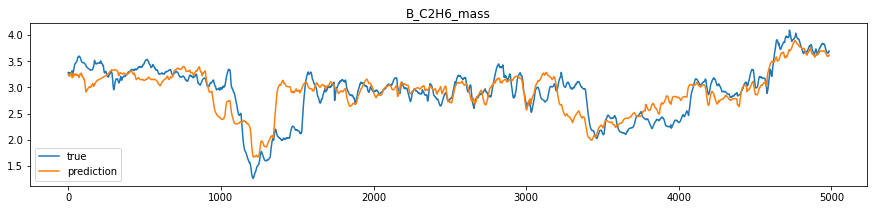

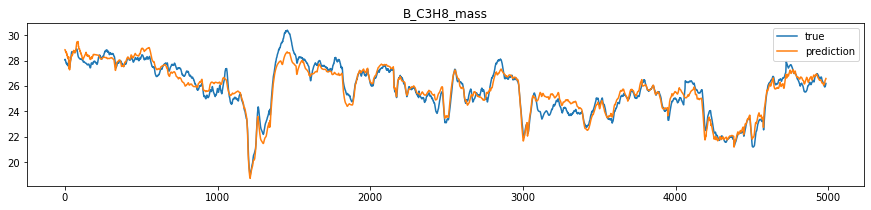

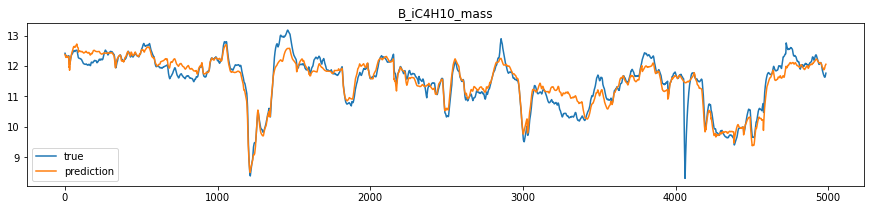

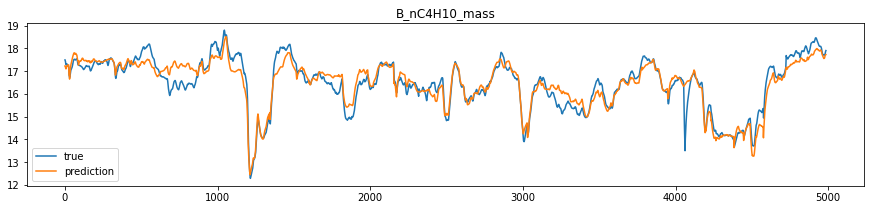

In [41]:
train_preds = predict(models, X_train[FEATURE_GASES_MASS])

for target, preds in zip(TARGET_COLUMNS_MASS, train_preds):
    plot_fitted_values(preds, y_train[target].values, target)

In [42]:
y_preds = [pred/test_B_rate_smoothed * 100 for pred in predict(models, X_test[FEATURE_GASES_MASS])]
sub = create_submission(X_test["timestamp"], y_preds)

In [45]:
y_preds = [pd.Series(s).transform(lambda x: x.ewm(30, min_periods=1).mean()).values for s in y_preds]
sub = create_submission(X_test["timestamp"], y_preds)

In [46]:
sub

,timestamp,B_C2H6,B_C3H8,B_iC4H10,B_nC4H10
0,2020-05-01 00:00,4.947420,36.565144,16.380946,23.863625
1,2020-05-01 00:30,4.946637,36.563225,16.376983,23.858080
2,2020-05-01 01:00,4.949105,36.603443,16.391575,23.875424
3,2020-05-01 01:30,4.952895,36.649917,16.406196,23.890851
4,2020-05-01 02:00,4.956519,36.691203,16.418197,23.902957
...,...,...,...,...,...
3979,2020-07-22 21:30,3.961994,38.959316,16.802792,23.674524
3980,2020-07-22 22:00,3.965206,38.944041,16.800936,23.672592
3981,2020-07-22 22:30,3.969158,38.934400,16.801559,23.674330
3982,2020-07-22 23:00,3.973595,38.928878,16.803811,23.678363


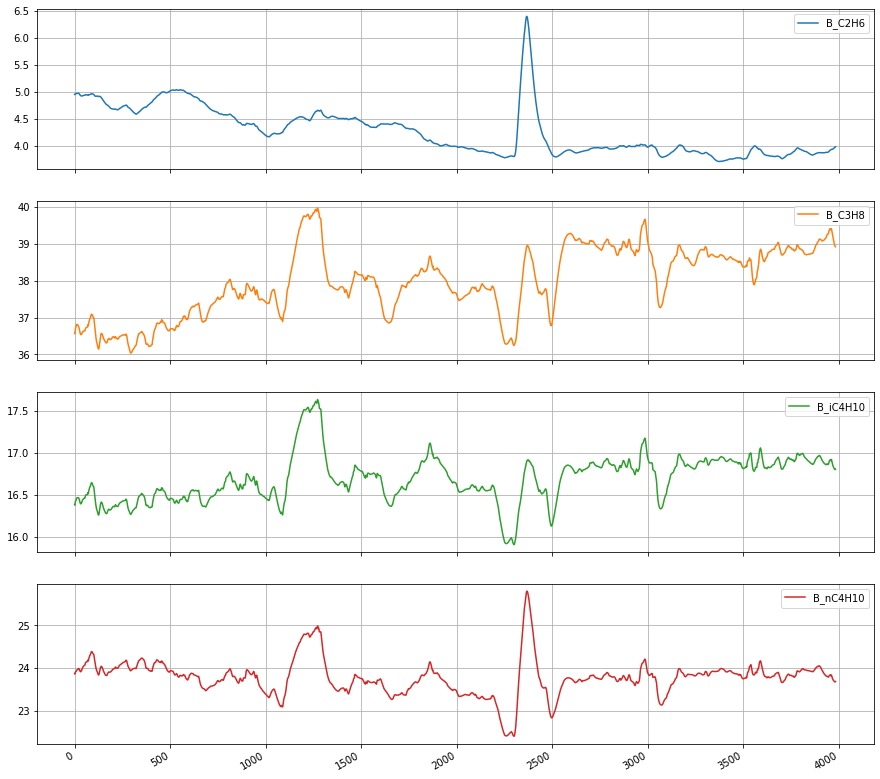

In [47]:
plot_series(sub[TARGET_COLUMNS])

In [48]:
sub.to_csv(f'submission.csv', index=False)

#### Work with loaded submission

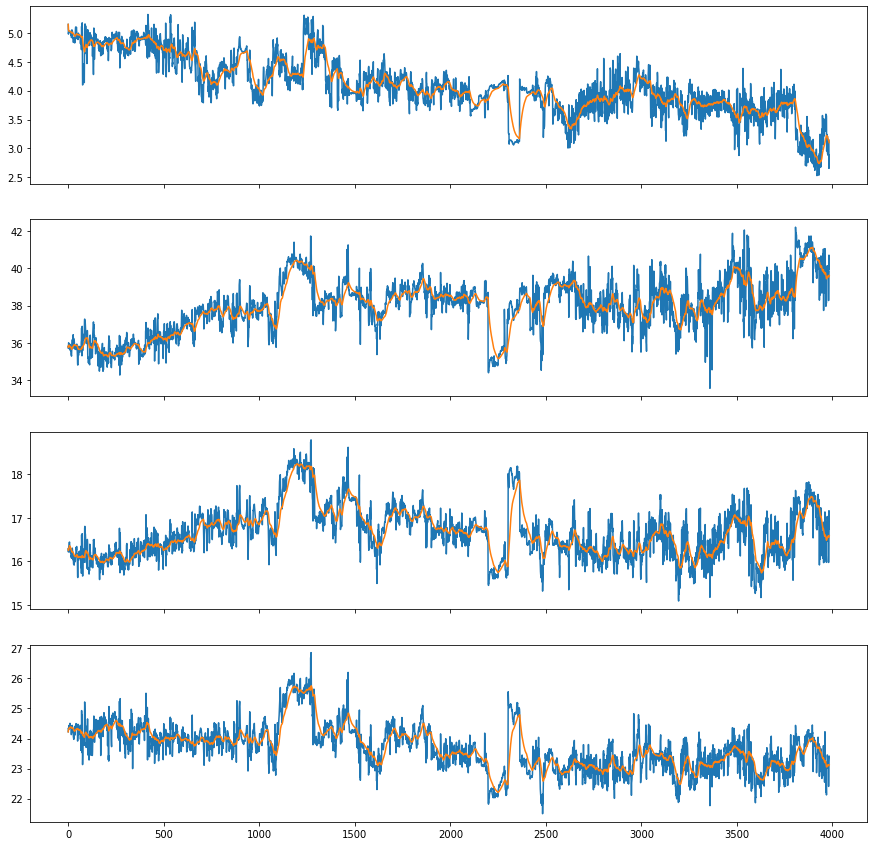

In [73]:
loaded_sub = pd.read_csv(f'submission-xgb.csv')

y_preds_smoothed = [loaded_sub[target].transform(lambda x: x.ewm(20, min_periods=1).mean()).values for target in TARGET_COLUMNS]
smoothed_sub = create_submission(X_test["timestamp"], y_preds_smoothed)
smoothed_sub.to_csv(f'submission-xgb-smoothed.csv', index=False)

_, axes = plt.subplots(4,1, figsize=(15,15), sharex=True)
for ax, target in zip(axes, TARGET_COLUMNS):
    ax.plot(loaded_sub[target].values)
    ax.plot(smoothed_sub[target].values)